In this part, we will be analysing 4 datasets scraped from Indeed based on the Big 4 accounting companies: Deloitte Touche Tohmatsu Limited (Deloitte), Ernst & Young (EY), KPMG International Cooperative
 (KPMG), and PricewaterhouseCoopers (PwC).

## 1. Combine and Clean Datasets

We will first combine the 4 seperated datasets as "Big4.xlsx" and then clean the data by removing all null values.

In [1]:
import pandas as pd
import numpy as np
import glob
glob.glob("C:/Users/fibim/Google Drive/BAN 612/Final Project/Big4*.xlsx") # locate all files

['C:/Users/fibim/Google Drive/BAN 612/Final Project\\Big4-Deloitte.xlsx',
 'C:/Users/fibim/Google Drive/BAN 612/Final Project\\Big4-EY.xlsx',
 'C:/Users/fibim/Google Drive/BAN 612/Final Project\\Big4-KPMG.xlsx',
 'C:/Users/fibim/Google Drive/BAN 612/Final Project\\Big4-Pwc.xlsx']

In [2]:
raw_df = pd.DataFrame()
for f in glob.glob("C:/Users/fibim/Google Drive/BAN 612/Final Project/Big4*.xlsx"):
    read = pd.read_excel(f)
    raw_df = raw_df.append(read,ignore_index=True) # combine all files
    
raw_df.tail() # check adn count rows: 498

,job_title,company,rating,reviews,location,job_description
494,IFS Automation Business Analyst Manager,PwC,4 out of 5,6943.0,"Tampa, FL 33607","A career in National Special Functions, within..."
495,Tax Knowledge Management People & Organization...,PwC,4 out of 5,6943.0,"New York, NY 10017",A career in PwC's Tax Knowledge Management pra...
496,Deal Analytics Manager,PwC,4 out of 5,6943.0,"Chicago, IL 60606",A career in our Deals Data and Analytics pract...
497,HIA Pharma & Life Sciences R&D Manager,PwC,4 out of 5,6943.0,"New York, NY 10017",Custom Orgs:\n\n\n\nGlobal LoS:\n\nAdvisory\n\...
498,Tax Technology User Experience (UI/UX) Manager,PwC,4 out of 5,6943.0,"Dallas, TX 75201",A career in our Innovation Development practic...


In [3]:
raw_df.isnull().sum() # check null

job_title          4
company            4
rating             6
reviews            6
location           6
job_description    4
dtype: int64

In [4]:
raw_df = raw_df.dropna() # drop null
raw_df.isnull().sum() # confirm drop

job_title          0
company            0
rating             0
reviews            0
location           0
job_description    0
dtype: int64

In [5]:
big4 = pd.ExcelWriter('Big4.xlsx')
raw_df.to_excel(big4)
big4.save() # save to new excel file

In [6]:
df = pd.read_excel('Big4.xlsx') # read new file
df.tail() # check adn count rows: 492 (6 rows removed)

,Unnamed: 0,job_title,company,rating,reviews,location,job_description
488,494,IFS Automation Business Analyst Manager,PwC,4 out of 5,6943,"Tampa, FL 33607","A career in National Special Functions, within..."
489,495,Tax Knowledge Management People & Organization...,PwC,4 out of 5,6943,"New York, NY 10017",A career in PwC's Tax Knowledge Management pra...
490,496,Deal Analytics Manager,PwC,4 out of 5,6943,"Chicago, IL 60606",A career in our Deals Data and Analytics pract...
491,497,HIA Pharma & Life Sciences R&D Manager,PwC,4 out of 5,6943,"New York, NY 10017",Custom Orgs:\n\n\n\nGlobal LoS:\n\nAdvisory\n\...
492,498,Tax Technology User Experience (UI/UX) Manager,PwC,4 out of 5,6943,"Dallas, TX 75201",A career in our Innovation Development practic...


## 2. Data Exploration
After the new dataset is ready, we will look into the company's, job title's, and location's distribution of the data.
### a) Comany Distribution

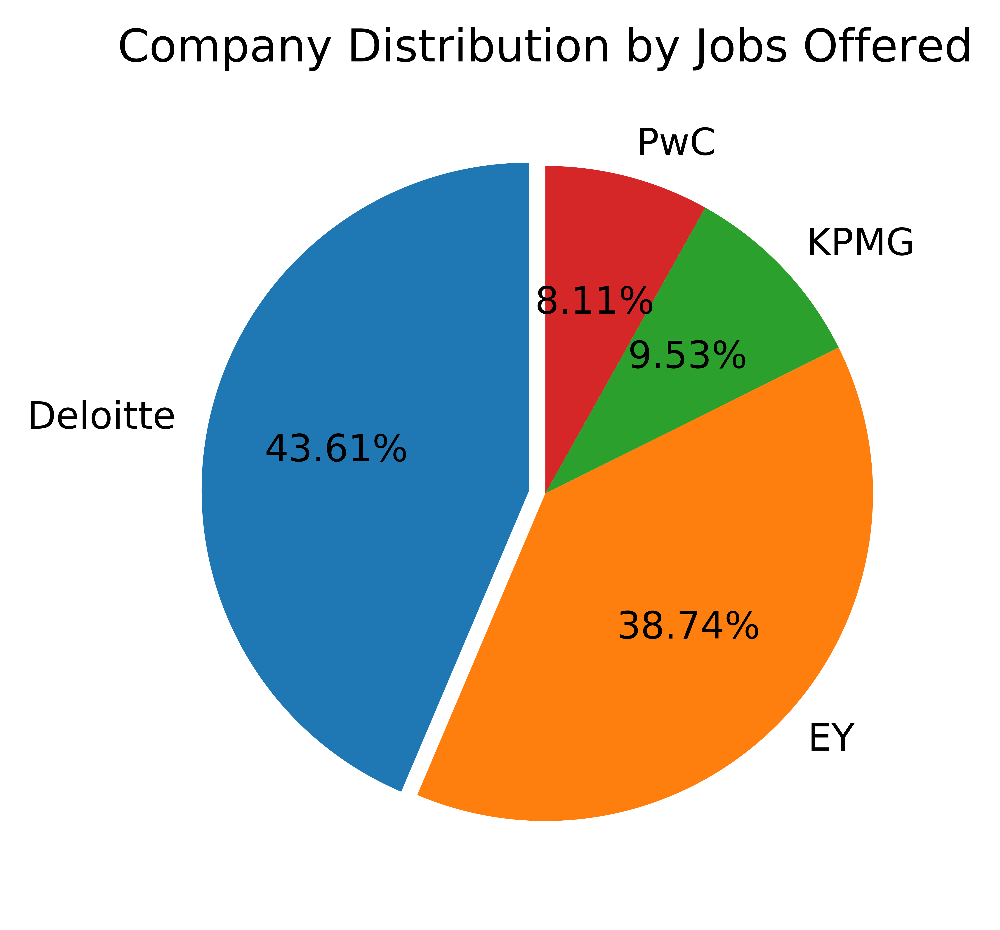

In [20]:
import matplotlib.pyplot as plt

names = df['company'].unique()
values = list(df['company'].value_counts())
explode = (0.05, 0, 0, 0) # explode the biggesst sector
plt.figure(dpi=1200)
plt.pie(values, labels=names, explode=explode, autopct='%.2f%%', startangle=90)
plt.title('Company Distribution by Jobs Offered')
plt.show()

### b) Most Listed Titles

In [9]:
names = df['job_title'].unique()[:10]
values = list(df['job_title'].value_counts())[:10]
explode = (0.05, 0.05, 0.05, 0.05, 0, 0, 0, 0, 0, 0) # explode the 4 biggesst sectors
plt.figure(dpi=1200)
plt.pie(values, labels=names, explode=explode, autopct='%.1f%%', startangle=90)
plt.title('10 Most Freq. Job Titles')
plt.axis('equal')
plt.show()

### c) Most Common Locations

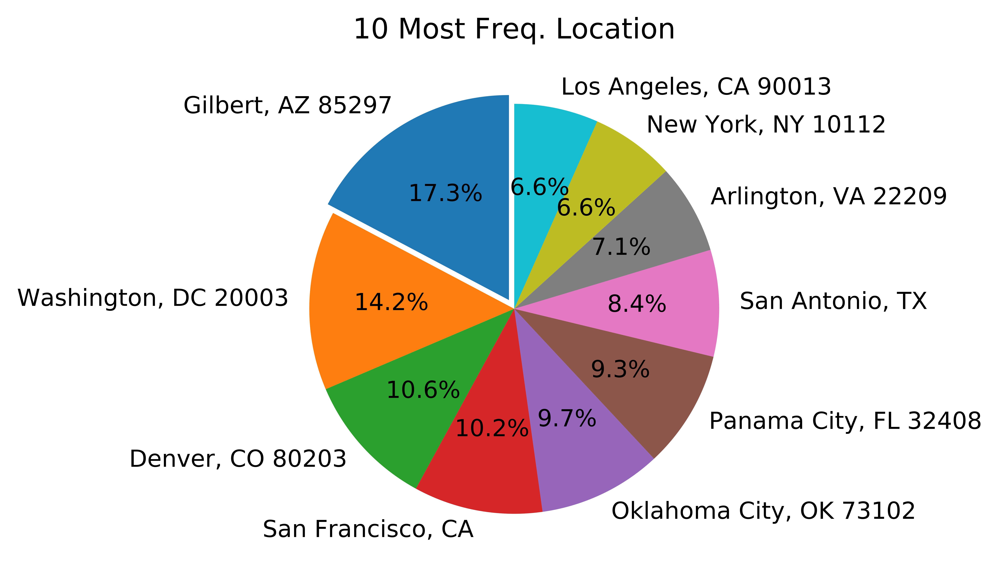

In [10]:
names = df['location'].unique()[:10]
values = list(df['location'].value_counts())[:10]
explode = (0.05, 0, 0, 0, 0, 0, 0, 0, 0, 0) # explode the biggesst sector
plt.figure(dpi=1200)
plt.pie(values, labels=names, explode=explode, autopct='%.1f%%', startangle=90)
#plt.barh(names, values, align='edge')
#plt.ylim(0,19) # 20 most freq results
#plt.xlabel('Counts')
plt.title('10 Most Freq. Location')
plt.show()

We can see that the job titles and locations are in all kinds of variations. Therefore it is better to combine the similar ones as groups. We will filter out the job titles with the word "Analyst" and see which types of analyst are the more demanded one using RE. We will also group the locations by states using similar methods.

### d) Most Listed Analyst Types

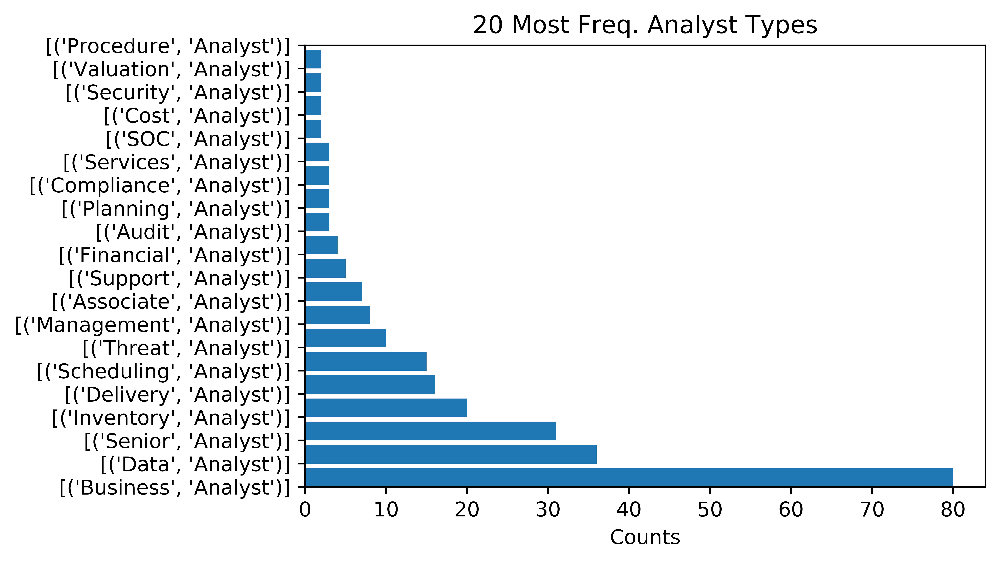

In [11]:
import re
import collections # for counter function

# find all types of Analyst by extracting one word ahead 'Analyst'
text = df['job_title']
job_title_pattern = r'\b\b([A-Za-z]+)\s(Analyst)' # one word before 'Analyst'
analyst_titles = []
for t in text:
    result = re.findall(job_title_pattern, t)
    if (len(result)==1):
        analyst_titles.append(str(result))

# create dictionary based on re results
analyst_counts = dict()
for i in analyst_titles:
    analyst_counts[i] = analyst_counts.get(i, 0) + 1

# sort the dictionary (dictionary is un-sortable, need to sort to list then convert back to dict)
analyst_counts_sorted = collections.OrderedDict(sorted(analyst_counts.items(), key=lambda kv: kv[1], reverse=True))

# plot chart
names = list(analyst_counts_sorted.keys())
values = list(analyst_counts_sorted.values())
plt.figure(dpi=1200)
plt.barh(names, values, align='edge')
plt.ylim(0,19) # 20 most freq results
plt.title('20 Most Freq. Analyst Types')
plt.xlabel('Counts')
plt.show()

### e) Most Common State

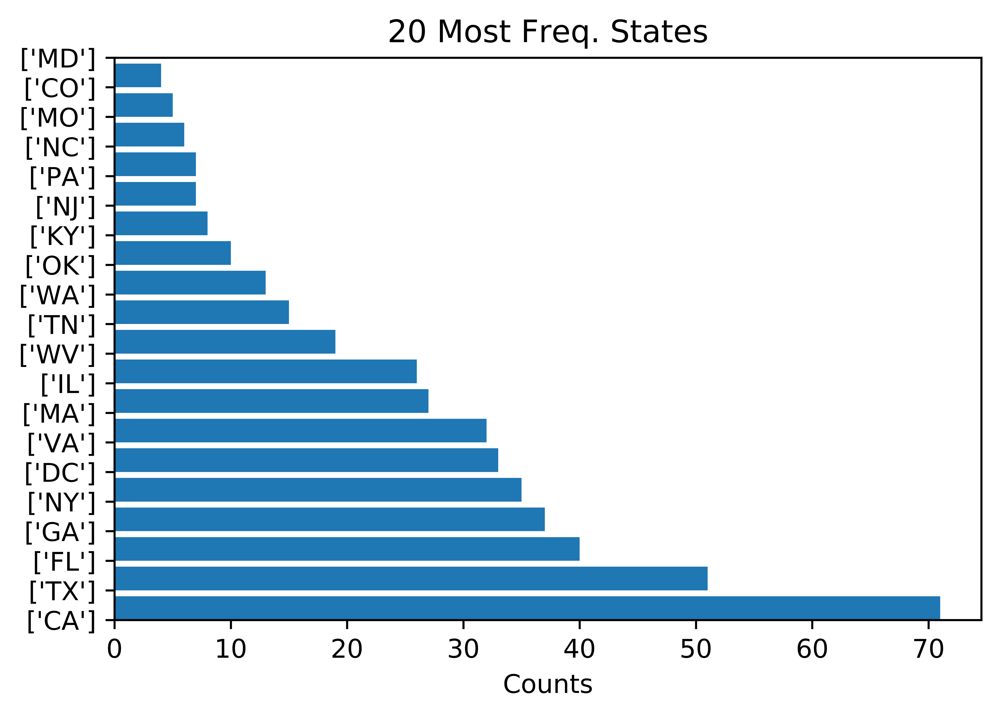

In [12]:
# group location by States
text = df['location']
states_pattern = r'[A-Z]+(?=[^,]*$)' # the word between ', ' and the postal code
states = []
for t in text:
    result = re.findall(states_pattern, t)
    if (len(result)==1):
        states.append(str(result))

# create dictionary based on re results
states_counts = dict()
for i in states:
    states_counts[i] = states_counts.get(i, 0) + 1

# sort the dictionary (dictionary is un-sortable, need to sort to list then convert back to dict)
states_counts_sorted = collections.OrderedDict(sorted(states_counts.items(), key=lambda kv: kv[1], reverse=True))

# plot chart
names = list(states_counts_sorted.keys())
values = list(states_counts_sorted.values())
plt.figure(dpi=1200)
plt.barh(names, values, align='edge')
plt.ylim(0,19) # 20 most freq results
plt.title('20 Most Freq. States')
plt.xlabel('Counts')
plt.show()

### f) Most Common Cities in CA

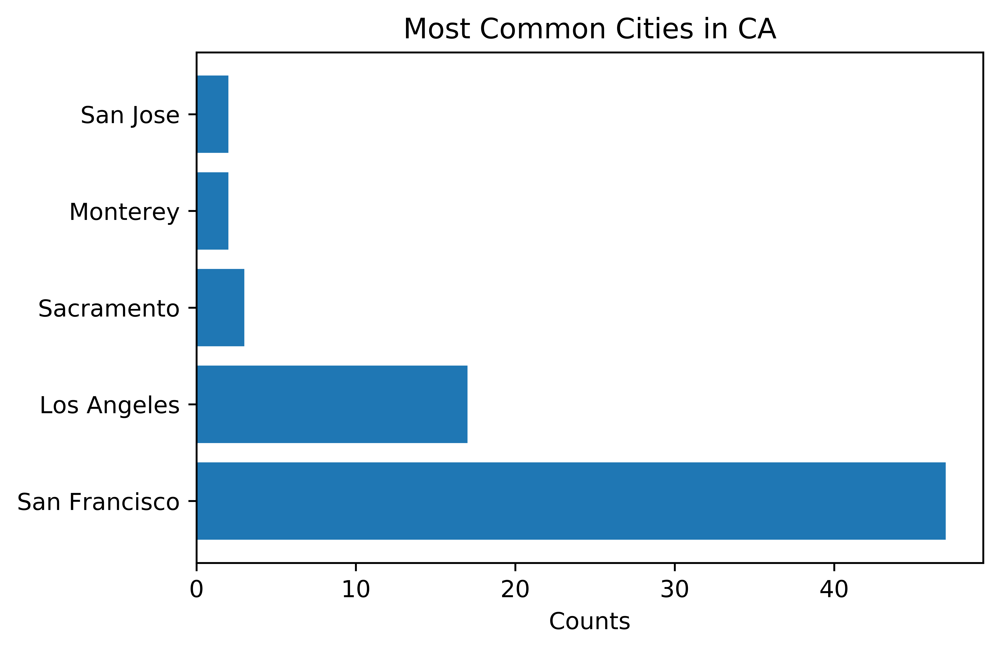

In [13]:
from collections import Counter
CA_cities = list(df[df['location'].str.contains(', CA', na=False)]['location']) # filter cities only in CA

for i in range(len(CA_cities)): # extract only the city
    CA_cities[i] = re.sub(",.*$", "", CA_cities[i])
    
city_counts = Counter(CA_cities) # count unique cities
#city_counts.most_common()

# plot chart
names = list(city_counts.keys())
values = list(city_counts.values())
plt.figure(dpi=1200)
plt.barh(names, values, align='center')
plt.title('Most Common Cities in CA')
plt.xlabel('Counts')
plt.show()

Other then job titles and locations, we can also count the number of keyword that appear the most in the job summaries.
### g) Most Common Words Mentioned in Job Summaries

In [14]:
from nltk.corpus import stopwords # this package helps clean up the meaningless word
#nltk.download('stopwords')

In [15]:
text = list(df['job_description'].str.split()) # split the summary to words into lists
all_text = [] # initialize the combined list
for l in text: # for each list in text
    for w in l: # for each word in list
        w = w.lower() # to lowercase
        if w not in stopwords.words("english"): # exclude words from stop words
            all_text.append(w)
#all_text

In [15]:
#pip install wordcloud # package for word cloud

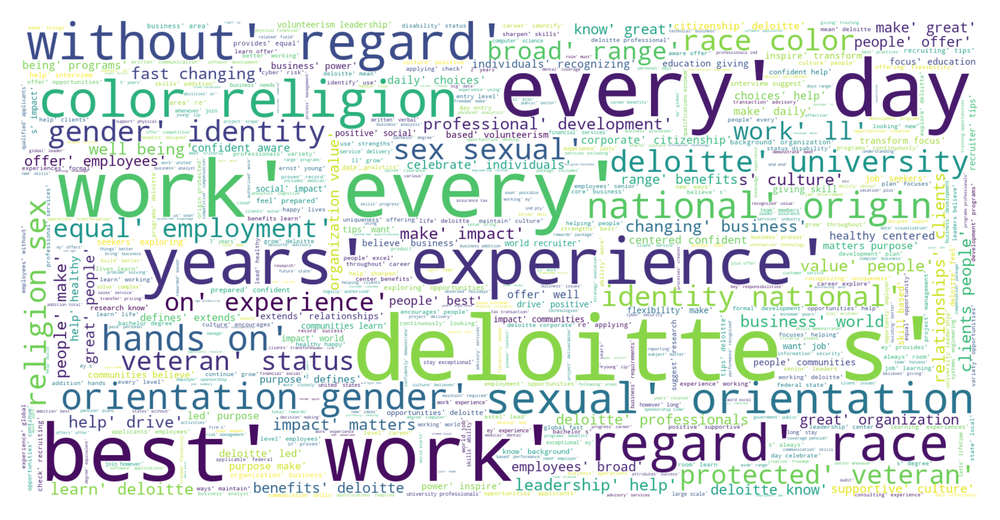

In [16]:
from wordcloud import WordCloud

wordcloud = WordCloud(max_font_size=150, max_words=500, 
                      width=1600, height=800, 
                      background_color="white").generate(str(all_text))
plt.figure(dpi=1200)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()
#fig.savefig('Big4-WordCloud.svg', format='svg', dpi=1200)

### h) Most Required Skills for Business Analysts and Data Analysts
The below skills listed are based on internet searches for 'most common skills for business and data analysts", results are referenced from https://www.rasmussen.edu/degrees/technology/blog/data-analyst-skills/, and https://www.northeastern.edu/graduate/blog/must-have-data-analyst-skills/.

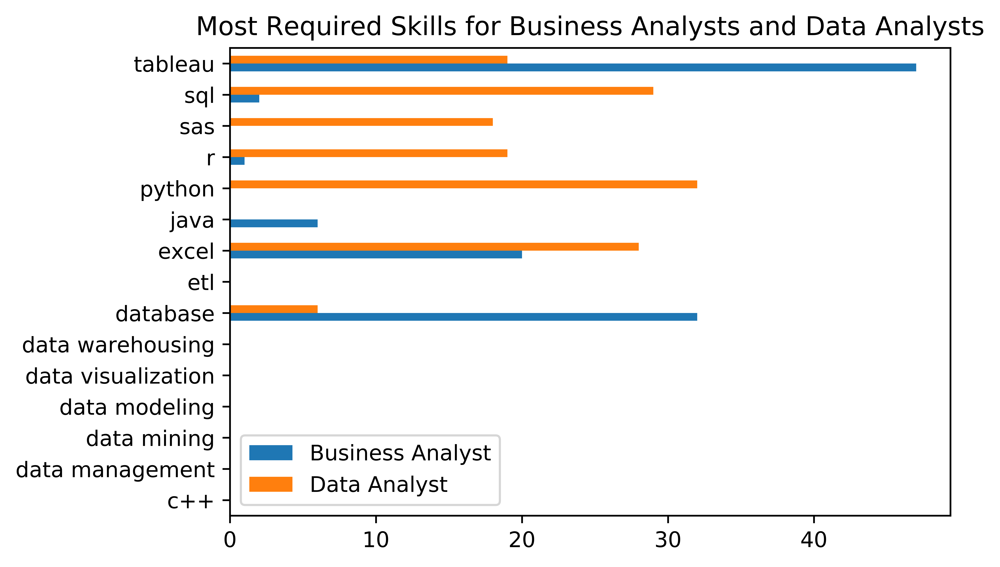

In [17]:
# looking for common required skills in Business Analyts and Data Analysts
def skills_count(x):
    combined = [] # initialize the combined list
    for l in x: # for each line in x (BA or DA)
        l = str(l.lower()).split() # to lowercase
        combined.extend(l)

    skills = ['sql', 'tableau', 'data warehousing', 'python', 'java', 'c++', 'excel', 'r', 'data visualization', 
             'sas', 'data management', 'etl', 'database', 'data mining', 'data modeling']

    wordcount = dict((x,0) for x in skills) # skills to dict
    for w in re.findall(r"\w+", str(combined)): # find words in wordcount from the combined list
        if w in wordcount:
            wordcount[w] += 1
    
    wordcount_sorted = collections.OrderedDict(sorted(wordcount.items(), key=lambda kv: kv[1], reverse=True)) # sort dict

    return(wordcount_sorted)

BA = list(df[df['job_title'].str.contains('Business Analyst')]['job_description'])
DA = list(df[df['job_title'].str.contains('Data Analyst')]['job_description'])

BA_DA_df = pd.DataFrame({'Business Analyst':pd.Series(skills_count(BA)),
                         'Data Analyst':pd.Series(skills_count(DA))}) # dictionaries to dataframes
# plot chart
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 1200 # for higher resolution images

BA_DA_df.plot.barh()
plt.title('Most Required Skills for Business Analysts and Data Analysts')
plt.show()